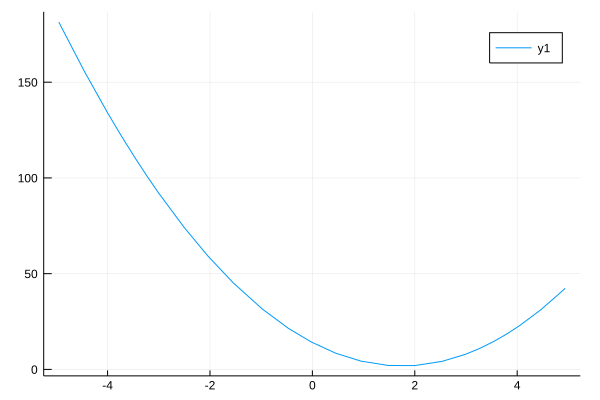

In [21]:
#This function returns another function, which is the Lagrange Interpolant of the values xvals and yvals.
function LagrangeInterpolantGenerator(xvals,yvals)
    function LagrangeInterpolant(x)
        numvalstoevaluate = length(x)
        numvalstoevaluate == 1 ? output = 0 : output = zeros(numvalstoevaluate)
        for k = 1:numvalstoevaluate
            N = length(xvals)
            LagrangePolynomials = ones(N)
            for i in 1:N  
                for j in [1:i-1;i+1:N]     #Surprisingly, this works even in the i=1 and i=N cases.
                    LagrangePolynomials[i] = LagrangePolynomials[i].*(x[k]-xvals[j])./(xvals[i]-xvals[j])
                end
            end
            numvalstoevaluate == 1 ? output = sum(LagrangePolynomials.*yvals) : output[k] = sum(LagrangePolynomials.*yvals)
        end
        return output
    end
    return LagrangeInterpolant
end

#Examples
interpolantfunc = LagrangeInterpolantGenerator([1.0,2.0,3.0],[4.0,2.0,8.0])
interpolantfunc(2.0)   #returns 2.0
interpolantfunc(3.0)   #returns 8.0
interpolantfunc(2.5)   #returns 5.375

using Plots
plot(interpolantfunc)

In [4]:

# wylosowanie węzłów interpolacji
xs =  1:1:10
A = [rand() for x in xs]

10-element Array{Float64,1}:
 0.8412891853620259 
 0.2210007865567749 
 0.14195913704137508
 0.25927406253651974
 0.2584949435577568 
 0.2713108946301297 
 0.42447648807716365
 0.23586741870631833
 0.41643051658522356
 0.2962165305867177 

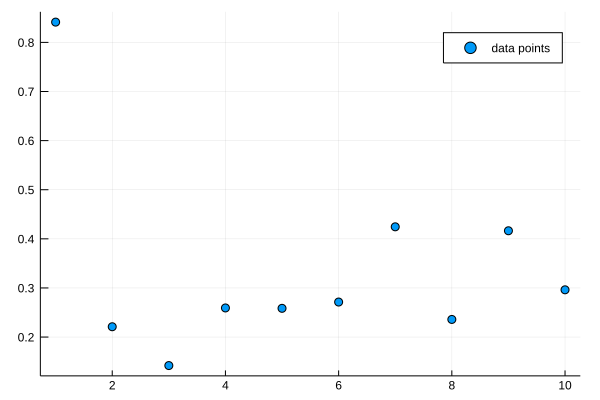

In [6]:
using Plots
scatter(xs,A, label="data points")

In [7]:
xsf=1:0.01:10

1.0:0.01:10.0

In [23]:
interpolantfunc = LagrangeInterpolantGenerator(A, A)

#using Plots
#plot(interpolantfunc)

(::getfield(Main, Symbol("#LagrangeInterpolant#8")){Array{Float64,1},Array{Float64,1}}) (generic function with 1 method)

In [18]:
type DividedDifferenceTable
x::Vector{Any} # data points (x-coordinate)
d::Vector{Any} # coefficients in the table
DividedDifferenceTable() = new(Array(Any,0),Array(Any,0))
end





LoadError: syntax: extra token "DividedDifferenceTable" after end of expression

In [14]:
function getNumPoints( T::DividedDifferenceTable )
    return length(T.x);
end


UndefVarError: UndefVarError: DividedDifferenceTable not defined

In [ ]:
function addPoint!( T::DividedDifferenceTable, x, y )
    n = getNumPoints(T); # number of data points
    T.x = [T.x,x]; # append the x-coordinate
    T.d = [T.d,y]; # append the y-coordinate
     for i=1:n
       nom = T.d[end]-T.d[end-n]; # nominator of d-d recursion
       den = T.x[end]-T.x[end-i]; # de-nominator of d-d recursion
       T.d = [T.d,nom/den]; # append the computed quotient
    end
end